# Рынок заведений общественного питания Москвы
**Описание проекта:**

* Инвесторы из фонда «Shut Up and Take My Money» решили попробовать себя в новой области и открыть заведение общественного питания в Москве. Заказчики ещё не знают, что это будет за место: кафе, ресторан, пиццерия, паб или бар, — и какими будут расположение, меню и цены.

* Для начала они просят вас — аналитика — подготовить исследование рынка Москвы, найти интересные особенности и презентовать полученные результаты, которые в будущем помогут в выборе подходящего инвесторам места.

* Постарайтесь сделать презентацию информативной и лаконичной. Её структура и оформление сильно влияют на восприятие информации читателями вашего исследования. Выбирать инструменты (matplotlib, seaborn и другие) и типы визуализаций вы можете самостоятельно.

* Вам доступен датасет с заведениями общественного питания Москвы, составленный на основе данных сервисов Яндекс Карты и Яндекс Бизнес на лето 2022 года. Информация, размещённая в сервисе Яндекс Бизнес, могла быть добавлена пользователями или найдена в общедоступных источниках. Она носит исключительно справочный характер.

In [1]:
!pip install chart_studio
!pip install cufflinks
!pip install folium

     |████████████████████████████████| 64 kB 1.0 MB/s eta 0:00:01
  Created wheel for retrying: filename=retrying-1.3.3-py3-none-any.whl size=11429 sha256=304ed2bfd50a89b8fe86a79171a5bb3cc5b4b2add879cc470875704979272823
  Stored in directory: /home/jovyan/.cache/pip/wheels/ce/18/7f/e9527e3e66db1456194ac7f61eb3211068c409edceecff2d31
Successfully built retrying
     |████████████████████████████████| 81 kB 978 kB/s eta 0:00:01
  Created wheel for cufflinks: filename=cufflinks-0.17.3-py3-none-any.whl size=67922 sha256=2513cebcaf7666b01ba0115ebf9c6bc5fe03e40da60d9039e30013c81603af03
  Stored in directory: /home/jovyan/.cache/pip/wheels/29/b4/f8/2fd2206eeeba6ccad8167e4e8894b8c4ec27bf1342037fd136
Successfully built cufflinks


In [2]:
import pandas as pd
import numpy as np
import seaborn as sns
import math as mth

from matplotlib import pyplot as plt
from scipy import stats as st

from folium import Map, Choropleth, Marker
from folium.plugins import MarkerCluster

import plotly.graph_objs as go
import chart_studio.plotly as py
from plotly.offline import iplot

import cufflinks
import json

### 1. Изучение общей информации о датасете

In [3]:
try:
    data = pd.read_csv('/datasets/moscow_places.csv', encoding="utf-8")
except:
    data = pd.read_csv('moscow_places.csv', encoding="utf-8")

In [4]:
display(data.head())
display(data.info())

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
0,WoWфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN
1,Четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0
2,Хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0
3,Dormouse Coffee Shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN
4,Иль Марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8406 entries, 0 to 8405
Data columns (total 14 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               8406 non-null   object 
 1   category           8406 non-null   object 
 2   address            8406 non-null   object 
 3   district           8406 non-null   object 
 4   hours              7870 non-null   object 
 5   lat                8406 non-null   float64
 6   lng                8406 non-null   float64
 7   rating             8406 non-null   float64
 8   price              3315 non-null   object 
 9   avg_bill           3816 non-null   object 
 10  middle_avg_bill    3149 non-null   float64
 11  middle_coffee_cup  535 non-null    float64
 12  chain              8406 non-null   int64  
 13  seats              4795 non-null   float64
dtypes: float64(6), int64(1), object(7)
memory usage: 919.5+ KB


None

***описание данных:***

* `name` - название заведения
* `address` - адрес заведения
* `category` - категория заведения
* `hours` - информация о днях и часах работы
* `lat` - широта (lattitude)
* `lng` - долгота (longtitude)
* `rating` - рейтинг
* `price` - ценовая категория
* `avg_bill` - средняя стоимость заказа (диапазон)
* `middle_avg_bill` - цена одной чашки капучино
* `chain` - сетевое заведение или нет (0 - нет, 1 - да)
* `district` - административный район
* `seats` - кол-во посадочных мест

### 2. Предобработка данных

##### 2.1 Проверим на дубликаты.

In [5]:
print(f'Кол-во дубликатов - {data.duplicated().sum()}.')

Кол-во дубликатов - 0.


##### 2.2 Проверим на пропуски.

In [6]:
print('Кол-во пропусков в различных столбцах:', end = '\n\n')
print(data.isna().sum())

Кол-во пропусков в различных столбцах:

name                    0
category                0
address                 0
district                0
hours                 536
lat                     0
lng                     0
rating                  0
price                5091
avg_bill             4590
middle_avg_bill      5257
middle_coffee_cup    7871
chain                   0
seats                3611
dtype: int64


***План действий:***

Посмотреть и придумать, что делать с пропусками в следующих столбцах:
* `hours`
* `price`
* `avg_bill`
* `middle_avg_bill`
* `middle_coffee_cup`
* `seats`

***1. `hours`***

In [7]:
print(f'Пропуски в `hours` составляют {round(data.hours.isna().sum()/data.hours.count()*100,2)}% от датасета.')
display(data[data['hours'].isna() == True].sample(3))

Пропуски в `hours` составляют 6.81% от датасета.


,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
5457,Вав,кафе,"Москва, Перовская улица, 69",Восточный административный округ,NaN,55.744891,37.803371,3.3,NaN,NaN,NaN,NaN,0,NaN
7735,Кафе бар,"бар,паб","Москва, Россошанский проезд, 2А",Южный административный округ,NaN,55.600615,37.607206,4.4,NaN,NaN,NaN,NaN,1,240.0
2871,Wild Bean Cafe,кофейня,"Москва, МКАД, 102-й километр, 20",Восточный административный округ,NaN,55.825050,37.833748,4.1,NaN,NaN,NaN,NaN,1,NaN


In [8]:
# удаляем пропуски, потому что они составляют всего 6.81% и также 
# вместе с пропусками в `hours` много пропусков в других столбцах

data = data.dropna(subset = ['hours']).reset_index(drop = True)

***2. `price`***

In [9]:
# `price` - это ценовая категория, слишком много пропусков,
# поэтому заменим NaN на `без категории`

data['price'] = data['price'].fillna('без категории')

***3. `avg_bill`, `middle_avg_bill`, `middle_coffee_cup`***

In [10]:
# здесь также много пропусков и просто удалить их мы не можем
# так как все значения численного типа, то заменим пропуски на -1

data['avg_bill'] = data['avg_bill'].fillna(-1)
data['middle_avg_bill'] = data['middle_avg_bill'].fillna(-1)
data['middle_coffee_cup'] = data['middle_coffee_cup'].fillna(-1)

***4. `seats`***

In [11]:
# тоже много пропусков, поэтому заполним значением `-1`

data['seats'] = data['seats'].fillna(-1)


In [12]:
print('Пропущенные значения после очистки датасета:', end = '\n')
display(data.isna().sum())

Пропущенные значения после очистки датасета:


name                 0
category             0
address              0
district             0
hours                0
lat                  0
lng                  0
rating               0
price                0
avg_bill             0
middle_avg_bill      0
middle_coffee_cup    0
chain                0
seats                0
dtype: int64

##### 2.3 Проверим на аномалии `middle_avg_bill`, `middle_coffee_cup` и `seats`.

***1. `middle_avg_bill`***

In [13]:
print('Собирательная статистика по `middle_avg_bill`:')
display(round(data[data['middle_avg_bill'] != -1]['middle_avg_bill'].describe(percentiles = [.25, .50, .75, .90, .95, .97, .99]),2))

Собирательная статистика по `middle_avg_bill`:


count     3143.00
mean       957.89
std       1010.51
min          0.00
25%        375.00
50%        750.00
75%       1250.00
90%       2000.00
95%       2250.00
97%       2750.00
99%       3750.00
max      35000.00
Name: middle_avg_bill, dtype: float64

In [14]:
# удалим значения > 30000
data = data[data['middle_avg_bill'] < 30000]

***2. `middle_coffee_cup`***

In [15]:
print('Собирательная статистика по `middle_coffee_cup`:')
display(round(data[data['middle_coffee_cup'] != -1]['middle_coffee_cup'].describe(percentiles = [.25, .50, .75, .90, .95, .97, .99]),2))

Собирательная статистика по `middle_coffee_cup`:


count     534.00
mean      174.51
std        88.91
min        60.00
25%       124.25
50%       168.00
75%       225.00
90%       256.00
95%       275.00
97%       290.01
99%       310.05
max      1568.00
Name: middle_coffee_cup, dtype: float64

In [16]:
# удалим значения > 1000
data = data[data['middle_coffee_cup'] < 1000]

***2. `seats`***

In [17]:
print('Собирательная статистика по `middle_coffee_cup`:')
display(round(data[data['seats'] != -1]['seats'].describe(percentiles = [.25, .50, .75, .90, .95, .97, .99]),2))

Собирательная статистика по `middle_coffee_cup`:


count    4493.00
mean      107.86
std       119.23
min         0.00
25%        40.00
50%        75.00
75%       140.00
90%       240.00
95%       306.40
97%       350.00
99%       625.00
max      1288.00
Name: seats, dtype: float64

In [18]:
# удалим значения > 1000
data = data[data['seats'] < 1000]
data = data.reset_index(drop = True)

##### 2.4 Создадим столбец `street` с названиями улиц из столбца с адресом.

In [19]:
# функция для получения названия улицы из адреса
def street(row):
    return row.split(', ')[1]

In [20]:
data['street'] = data['address'].apply(street)
data.head()

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street
0,WoWфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,без категории,-1,-1.0,-1.0,0,-1.0,улица Дыбенко
1,Четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,-1.0,0,4.0,улица Дыбенко
2,Хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,-1.0,0,45.0,Клязьминская улица
3,Dormouse Coffee Shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,без категории,Цена чашки капучино:155–185 ₽,-1.0,170.0,0,-1.0,улица Маршала Федоренко
4,Иль Марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,-1.0,1,148.0,Правобережная улица


##### 2.5 Создайте столбец `is_24/7` с обозначением, что заведение работает ежедневно и круглосуточно (24/7)
* `True` - круглосуточно
* `False` - некруглосуточно

In [21]:
def is_24_7(row):
    if row == 'ежедневно, круглосуточно':
        return True
    else:
        return False

In [22]:
data['is_24_7'] = data['hours'].apply(is_24_7)
data.sample(3)

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,is_24_7
7456,Fresh Coffee Bar,кофейня,"Москва, Дмитровское шоссе, 163Ак1",Северо-Восточный административный округ,"ежедневно, 10:00–22:00",55.909740,37.541507,4.9,без категории,-1,-1.0,-1.0,0,-1.0,Дмитровское шоссе,False
4492,Грабли,ресторан,"Москва, Цветной бульвар, 11с2",Центральный административный округ,пн-чт 09:00–22:00; пт 09:00–23:00; сб 10:00–23...,55.770207,37.620747,4.4,средние,Средний счёт:550 ₽,550.0,-1.0,1,-1.0,Цветной бульвар,False
4168,Хачапури,кафе,"Москва, Кривоколенный переулок, 12, стр. 8",Центральный административный округ,"ежедневно, 11:00–23:00",55.761620,37.636027,4.6,выше среднего,Средний счёт:1500 ₽,1500.0,-1.0,1,-1.0,Кривоколенный переулок,False


### 3. Анализ данных

##### 3.1 Какие категории заведений представлены в данных?

In [23]:
display(pd.DataFrame(data.category.unique()).rename(columns = {0 : 'Категории заведений'}))

,Категории заведений
0,кафе
1,ресторан
2,кофейня
3,пиццерия
4,"бар,паб"
5,быстрое питание
6,булочная
7,столовая


###### 3.2 Исследуйте количество объектов общественного питания по категориям: рестораны, кофейни, пиццерии, бары и так далее. Постройте визуализации. Ответьте на вопрос о распределении заведений по категориям.

In [24]:
task32 = (data.groupby('category', as_index = False)['name']
              .count()
              .rename(columns = {'name' : 'amount'})
              .sort_values(by = 'amount', ascending = False)
              .reset_index(drop = True))
task32

,category,amount
0,кафе,2002
1,ресторан,1965
2,кофейня,1394
3,"бар,паб",745
4,пиццерия,627
5,быстрое питание,569
6,столовая,305
7,булочная,249


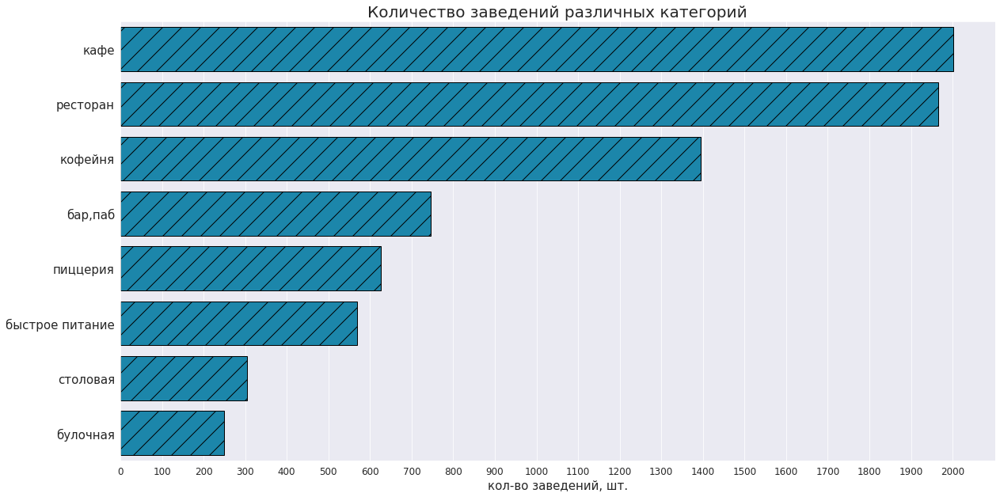

In [25]:
sns.set_style('darkgrid')
plt.figure(figsize = (19.8,10.2))

sns.barplot(data = task32, x = 'amount', y = 'category', color = '#0492C2', edgecolor = 'black', hatch = '/')

plt.title('Количество заведений различных категорий', size = 20)
plt.xlabel('кол-во заведений, шт.', size = 15)
plt.ylabel('')
plt.yticks(size = 15)
plt.xticks(range(0,2003, 100) ,size = 12)


plt.show()

*Больше всего заведений категорий кафе, ресторан, кофейня, **меньше** всего булочных и столовых.*

##### 3.3 Исследуйте количество посадочных мест в местах по категориям: рестораны, кофейни, пиццерии, бары и так далее. Постройте визуализации. Проанализируйте результаты и сделайте выводы.

In [26]:
task33 = (data.query('seats != -1')
              .groupby('category', as_index = False)['seats']
              .mean()
              .sort_values(by = 'seats', ascending = False)
              .rename(columns = {'seats' : 'average_seats'}))
task33

,category,average_seats
6,ресторан,118.589934
0,"бар,паб",117.279736
4,кофейня,107.323887
2,быстрое питание,97.544892
3,кафе,93.119883
7,столовая,92.732484
5,пиццерия,91.793839
1,булочная,90.054795


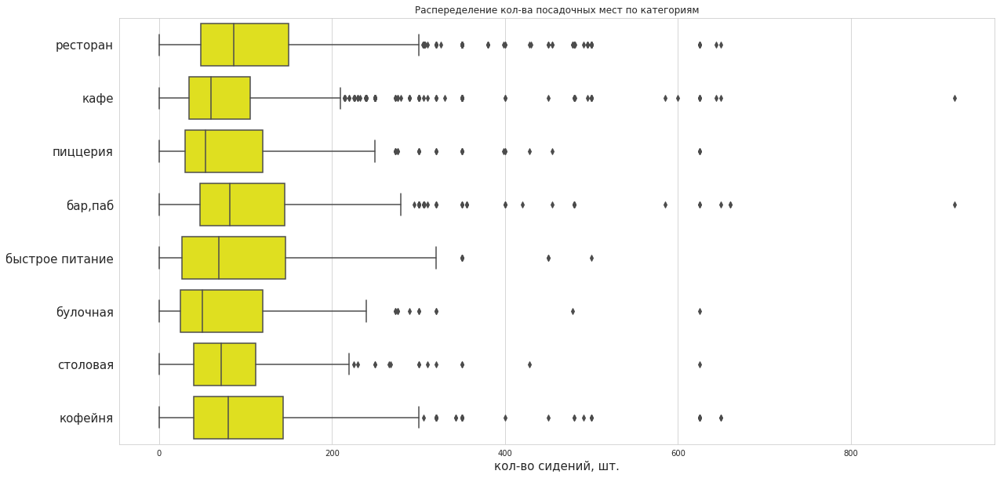

In [27]:
sns.set_style('whitegrid')
plt.figure(figsize = (20, 10))
sns.boxplot(data = data.query('seats != -1'), x = 'seats', y = 'category', color = 'yellow')

plt.title('Распеределение кол-ва посадочных мест по категориям')
plt.xlabel('кол-во сидений, шт.', size = 15)
plt.ylabel('')
plt.yticks(size = 15)

plt.show()

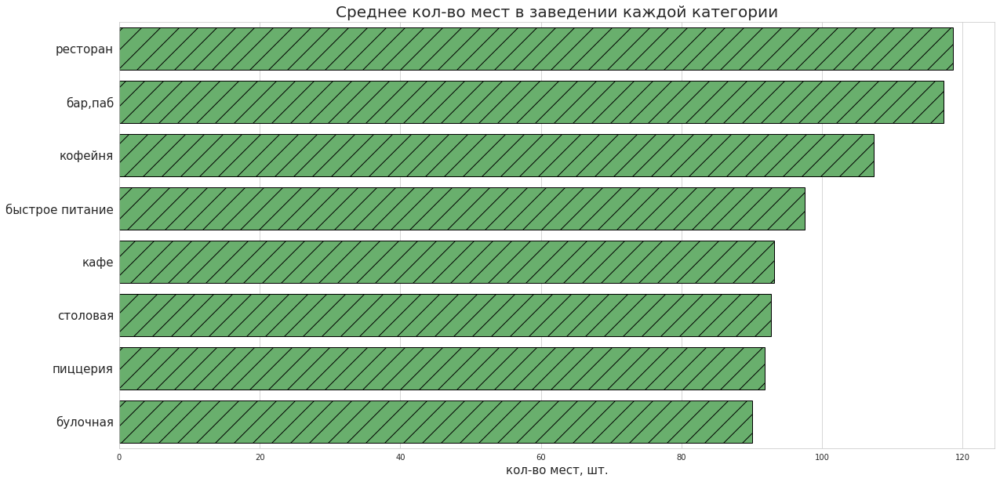

In [28]:
plt.figure(figsize = (20,10))

sns.barplot(data = task33, x = 'average_seats', y = 'category', color = '#5DBB63', edgecolor = 'black', hatch = '/')

plt.title('Среднее кол-во мест в заведении каждой категории', size = 20)
plt.xlabel('кол-во мест, шт.', size = 15)
plt.ylabel('')
plt.yticks(size = 15)

plt.show()

*В среднем больше всего мест в заведениях категорий ресторан, бар, паб, кофейня. Меньше всего в булочных и пиццерий. Это может быть обусловлено тем, что пиццу и булочки в основном берут с собой или доставку, а ресторан, бар, паб и кофейня - отличные места для местопровождения и наслаждения продукцией.*

##### 3.4 Рассмотрите и изобразите соотношение сетевых и несетевых заведений в датасете. Каких заведений больше?

In [29]:
task34 = (data.groupby('chain', as_index = False)['name']
              .count()
              .sort_values(by = 'name', ascending = False)
              .rename(columns = {'name' : 'amount'}))
task34.iloc[0,0] = 'несетевое'
task34.iloc[1,0] = 'сетевое'

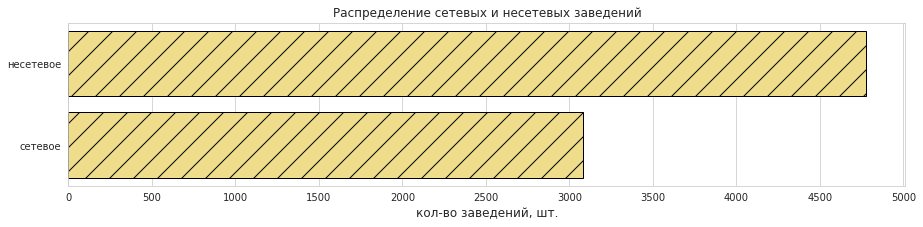

In [30]:
plt.figure(figsize = (15,3))

sns.barplot(data = task34, x = 'amount', y = 'chain', orient = 'h', color = '#FFE87C', edgecolor = 'black', hatch = '/')

plt.title('Распределение сетевых и несетевых заведений', size = 12)
plt.xlabel('кол-во заведений, шт.', size = 12)
plt.ylabel('')
plt.yticks(size = 10)
plt.xticks(range(0,5001,500))

plt.show()

*Больше несетевых заведений.*

##### 3.5 Какие категории заведений чаще являются сетевыми? Исследуйте данные и ответьте на вопрос графиком.

In [31]:
# считаем кол-во сетевых заведений по каждой категории
task35 = (data.query('chain == 1')
              .groupby('category', as_index = False)['name']
              .count().sort_values(by = 'name', ascending = False)
              .rename(columns = {'name' : 'amount_chain'}))

# считаем общее кол-во заведений по каждой категории
task351 = (data.groupby('category', as_index = False)['name']
               .count().sort_values(by = 'name', ascending = False)
               .rename(columns = {'name' : 'amount_all'}))


task35 = task35.merge(task351, on = 'category')
task35['chain_percentage'] = task35['amount_chain'] / task35['amount_all']
task35 = task35.drop(columns = ['amount_chain', 'amount_all']).sort_values(by = 'chain_percentage', ascending = False)
task35

,category,chain_percentage
6,булочная,0.618474
3,пиццерия,0.524721
1,кофейня,0.510043
4,быстрое питание,0.391916
2,ресторан,0.361323
0,кафе,0.355145
7,столовая,0.278689
5,"бар,паб",0.213423


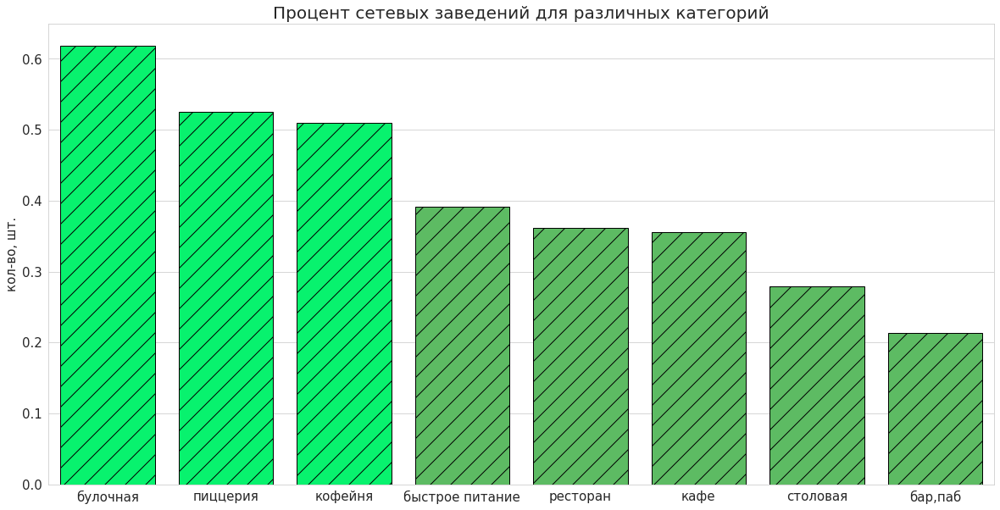

In [32]:
plt.figure(figsize = (20,10))

sns.barplot(data = task35, x = 'category', y = 'chain_percentage',
            color = '#900D09', edgecolor = 'black', hatch = '/',
            palette = ['#08F26E','#08F26E','#08F26E','#5DBB63','#5DBB63','#5DBB63','#5DBB63','#5DBB63'],
            saturation = 1)

plt.title('Процент сетевых заведений для различных категорий', size = 20)
plt.ylabel('кол-во, шт.', size = 15)
plt.xlabel('')
plt.yticks(size = 15)
plt.xticks(size = 15)


plt.show()

*Чаще всего сетевыми являются заведения категорий булочная, пиццерий, кофейня. Меньше всего баров, пабов, столовая, кафе.*

##### 3.6 Сгруппируйте данные по названиям заведений и найдите топ-15 популярных сетей в Москве. Постройте подходящую для такой информации визуализацию.

In [33]:
task36 = (data.query('chain == 1')
              .groupby('name', as_index = False)['category']
              .count()
              .sort_values(by = 'category', ascending = False)
              .rename(columns = {'category' : 'amount'})
              .reset_index(drop = True)
              .head(15))

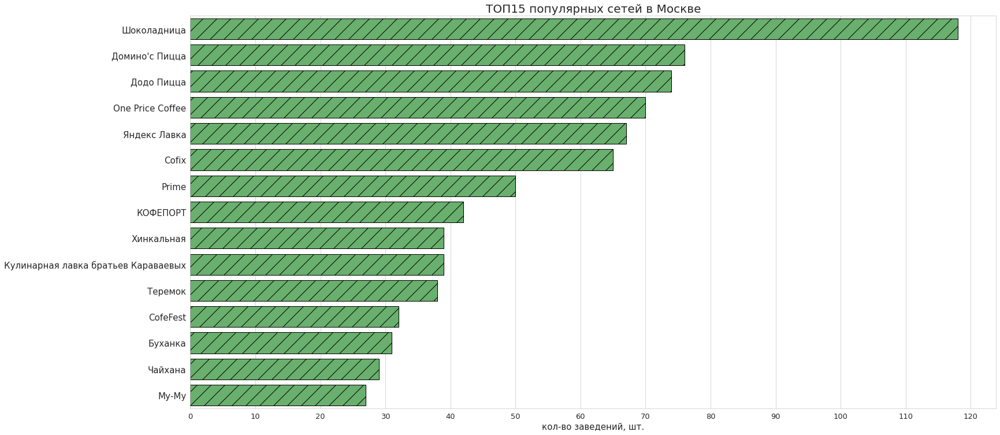

In [34]:
plt.figure(figsize = (25,12.5))

sns.barplot(data = task36, x = 'amount', y = 'name', color = '#5DBB63', edgecolor = 'black', hatch = '/')

plt.title('ТОП15 популярных сетей в Москве', size = 20)
plt.xlabel('кол-во заведений, шт.', size = 15)
plt.ylabel('')
plt.yticks(size = 15)
plt.xticks(range(0,121,10), size = 13)

plt.show()

##### 3.7 Знакомы ли вам эти сети? Есть ли какой-то признак, который их объединяет? Отобразите общее количество заведений и количество заведений каждой категории по районам.

In [35]:
task37 = (data.query('chain == 1')
              .drop(columns = ['address', 'district', 'hours', 'lat', 'lng', 'rating',
                               'price', 'avg_bill', 'middle_avg_bill', 'middle_coffee_cup',
                               'chain', 'seats', 'street', 'is_24_7'])
              .drop_duplicates())
task37 = task36.merge(task37, on = 'name').groupby('category', as_index = False).name.count().sort_values(by = 'name', ascending = False)

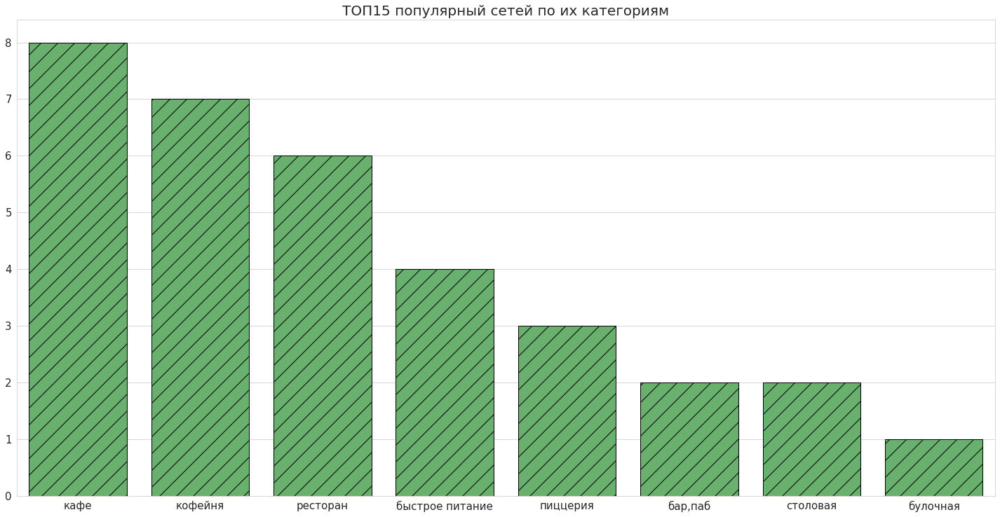

In [36]:
plt.figure(figsize = (25,12.5))

sns.barplot(data = task37, x = 'category', y = 'name', color = '#5DBB63', edgecolor = 'black', hatch = '/')

plt.title('ТОП15 популярный сетей по их категориям', size = 20)
plt.xticks(size = 15)
plt.xlabel('')
plt.ylabel('')
plt.yticks(size = 15)

plt.show()

In [37]:
task_new = data.query('name in @task36.name').groupby('district', as_index = False).name.count()

In [38]:
with open('/datasets/admin_level_geomap.geojson', 'r') as f:
        geo_json = json.load(f)

state_geo = '/datasets/admin_level_geomap.geojson'
# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=task_new,
    columns=['district', 'name'],
    key_on='feature.name',
    fill_color='PuBu',
    fill_opacity=0.5,
    legend_name='Кол-во заведений среди ТОП15 сетей по районам',
).add_to(m)

# выводим карту
m

*Да, все эти сеты знакомы. Их объединяет то, что большинство это либо кафе, кофейни или рестораны. Большинство из них находятся в ЦАО.* 

##### 3.8 К какой категории заведений они относятся?

In [39]:
task38 = list(task36.name)
print(list(data.query('name in @task38').category.unique()))

['булочная', 'пиццерия', 'кофейня', 'кафе', 'ресторан', 'быстрое питание', 'столовая', 'бар,паб']


##### 3.9 Какие административные районы Москвы присутствуют в датасете? Отобразите общее количество заведений и количество заведений каждой категории по районам. Попробуйте проиллюстрировать эту информацию одним графиком.

In [40]:
task39 = (data.groupby(['district', 'category'], as_index = False)['name']
              .count()
              .rename(columns = {'name' : 'amount'}))

In [41]:
# ф-я чтобы убрать приставку 'административный округ' из округов
def district_cut(row):
    return row.split(' ')[0]

task39['new_district'] = task39['district'].apply(district_cut)
task39 = task39.drop(columns = ['district'])

Общее кол-во заведений - 5307 шт.


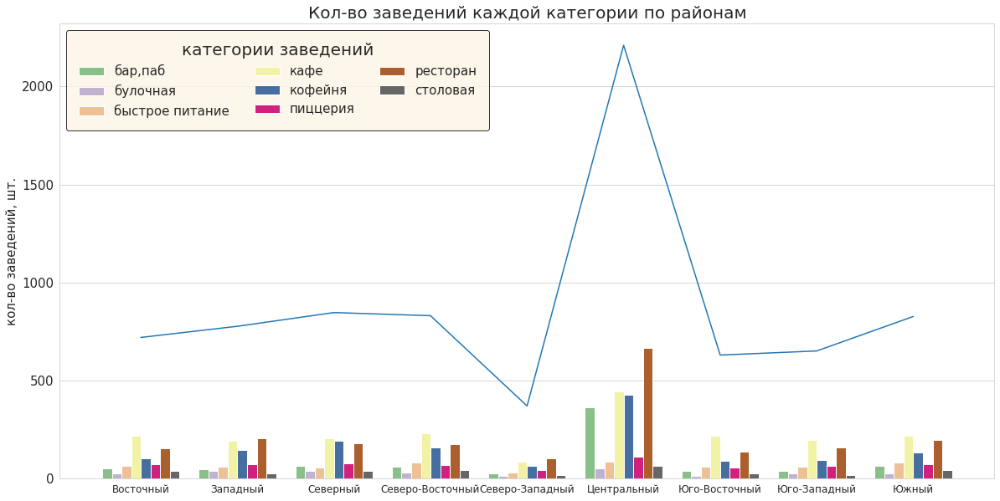

In [42]:
plt.figure(figsize = (20,10))

print(f'Общее кол-во заведений - {len(data.name.unique())} шт.')

ax=sns.barplot(data = task39, x = 'new_district', y = 'amount', hue = 'category', palette = 'Accent')
sns.lineplot(data=task39.groupby('new_district').amount.sum(), ax=ax)

plt.title('Кол-во заведений каждой категории по районам', size = 20)
plt.xlabel('', size = 15)
plt.ylabel('кол-во заведений, шт.', size = 15)
plt.yticks(size = 15)
plt.xticks(size = 12)

plt.legend(shadow = False,
           fontsize = 15,
           title = 'категории заведений',
           title_fontsize = 20,
           ncol = 3,
           facecolor = 'oldlace',
           edgecolor = 'black',
           borderpad=1)    

plt.show()

##### 3.11 Визуализируйте распределение средних рейтингов по категориям заведений. Сильно ли различаются усреднённые рейтинги в разных типах общепита?

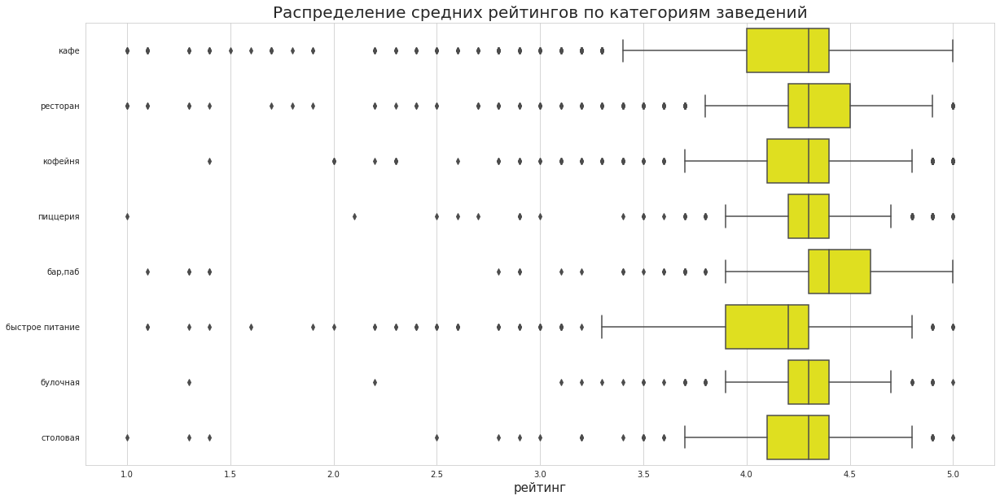

In [43]:
plt.figure(figsize = (20,10))

sns.boxplot(data = data, x = 'rating', y = 'category', color = 'yellow')
    
plt.ylabel('')
plt.xlabel('рейтинг', size = 15)
plt.title('Распределение средних рейтингов по категориям заведений', size = 20)


plt.show()

*Можно сделать вывод, что медиана рейтингов у всех категорий примерно одинаковая. Но всё же выше всего рейтинги у категорий бар, паб, ресторан и кафе.*

##### 3.12 Постройте фоновую картограмму (хороплет) со средним рейтингом заведений каждого района. Границы районов Москвы, которые встречаются в датасете, хранятся в файле `admin_level_geomap.geojson`

In [44]:
rating_df = data.groupby('district', as_index = False).rating.mean()
rating_df

,district,rating
0,Восточный административный округ,4.189152
1,Западный административный округ,4.193943
2,Северный административный округ,4.253664
3,Северо-Восточный административный округ,4.160602
4,Северо-Западный административный округ,4.237398
5,Центральный административный округ,4.379285
6,Юго-Восточный административный округ,4.124324
7,Юго-Западный административный округ,4.191077
8,Южный административный округ,4.188741


In [45]:
with open('/datasets/admin_level_geomap.geojson', 'r') as f:
        geo_json = json.load(f)

state_geo = '/datasets/admin_level_geomap.geojson'
# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=rating_df,
    columns=['district', 'rating'],
    key_on='feature.name',
    fill_color='PuBu',
    fill_opacity=0.5,
    legend_name='Средний рейтинг заведений по районам',
).add_to(m)

# выводим карту
m

*Можно сделать вывод, что самый высокий рейтинг у ЦАО, чуть поменьше у ЗАО и САО. У остальных районов примерно одинаковые рейтинги.*

##### 3.13 Отобразите все заведения датасета на карте с помощью кластеров средствами библиотеки `folium`

In [46]:
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)
# создаём пустой кластер, добавляем его на карту
marker_cluster = MarkerCluster().add_to(m)

# пишем функцию, которая принимает строку датафрейма,
# создаёт маркер в текущей точке и добавляет его в кластер marker_cluster
def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}",
    ).add_to(marker_cluster)

# применяем функцию create_clusters() к каждой строке датафрейма
data.apply(create_clusters, axis=1)

# выводим карту
m

*Можно сделать вывод, что гораздо больше заведений с большим отрывом от всех в ЦАО, а меньше всего на востоке.*

##### 3.14 Найдите топ-15 улиц по количеству заведений. Постройте график распределения количества заведений и их категорий по этим улицам. Попробуйте проиллюстрировать эту информацию одним графиком.

In [47]:
# находим топ15 улиц по кол-ву заведений
top15_streets_amount = (data.groupby('street', as_index = False)
                            .name
                            .count()
                            .rename(columns = {'name' : 'amount'})
                            .sort_values(by = 'amount', ascending = False)
                            .reset_index(drop = True)
                            .head(15))

In [48]:
list_top15_streets = list(top15_streets_amount.street) # формируем список топ15 улиц

task314 = (data.query('street in @list_top15_streets')
               .groupby(['street', 'category'], as_index = False)
               .name
               .count()
               .rename(columns = {'name' : 'amount'}))

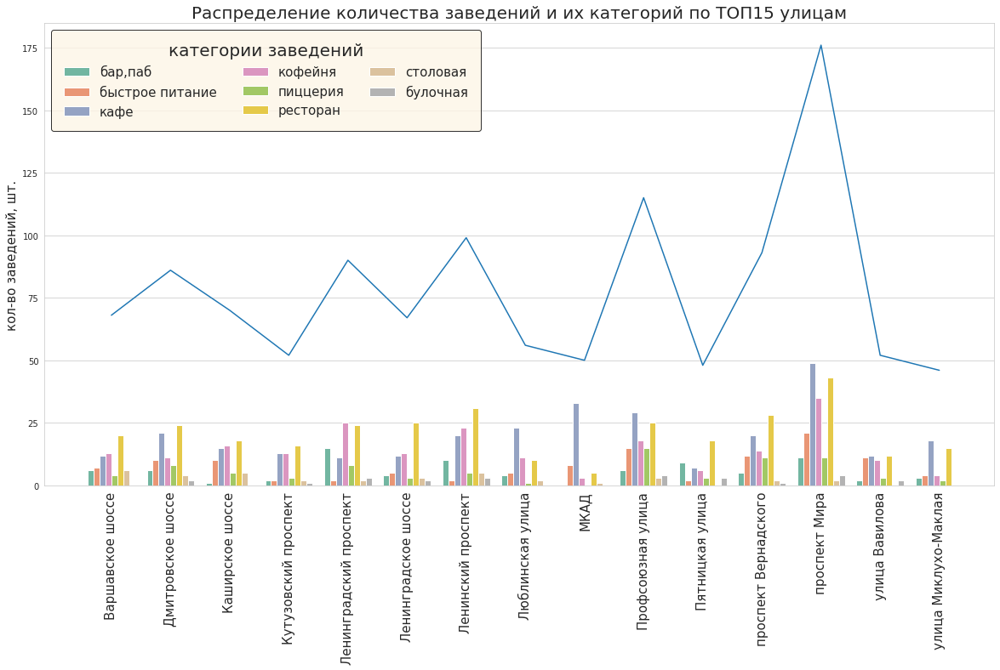

In [49]:
plt.figure(figsize = (20,10))
ax=sns.barplot(data = task314, x = 'street', y = 'amount', hue = 'category', palette = 'Set2')
sns.lineplot(data=task314.groupby('street').amount.sum(), ax=ax)

plt.title('Распределение количества заведений и их категорий по ТОП15 улицам', size = 20)
plt.xlabel('', size = 15)
plt.ylabel('кол-во заведений, шт.', size = 15)
plt.xticks(rotation = 90, size = 15)

plt.legend(shadow = False,
           fontsize = 15,
           title = 'категории заведений',
           title_fontsize = 20,
           ncol = 3,
           facecolor = 'oldlace',
           edgecolor = 'black',
           borderpad=1)    

plt.show()

##### 3.15 Найдите улицы, на которых находится только один объект общепита. Что можно сказать об этих заведениях?

In [50]:
streets_with_single_place = (data.groupby('street', as_index = False)
                                .name
                                .count()
                                .rename(columns = {'name' : 'amount'})
                                .sort_values(by = 'amount', ascending = False)
                                .reset_index(drop = True)
                                .query('amount == 1')
                                .street
                                .to_list())

single_places = data.query('street in @streets_with_single_place').reset_index(drop = True)

In [51]:
for column in single_places:
    if column in ['category', 'district', 'price', 'is_24_7']:
        display(single_places.groupby(column, as_index = False)
                             .name
                             .count()
                             .rename(columns = {'name' : 'count'})
                             .sort_values(by = 'count', ascending = False)
                             .reset_index(drop = True))

,category,count
0,кафе,150
1,ресторан,97
2,кофейня,91
3,"бар,паб",41
4,столовая,39
5,быстрое питание,28
6,пиццерия,15
7,булочная,10


,district,count
0,Центральный административный округ,144
1,Северный административный округ,60
2,Восточный административный округ,59
3,Северо-Восточный административный округ,56
4,Южный административный округ,40
5,Западный административный округ,39
6,Юго-Восточный административный округ,37
7,Северо-Западный административный округ,19
8,Юго-Западный административный округ,17


,price,count
0,без категории,282
1,средние,125
2,выше среднего,29
3,высокие,24
4,низкие,11


,is_24_7,count
0,False,433
1,True,38


**Про заведения, которые являются единственными на улице, можно сказать, что в основном это заведения:**
1. *Категории кафе, ресторан или кофейня*
2. *Расположенные в Центральном административном округе*
3. *У которых нет категории (возможно это значит, что заведения не такие популярные, что там даже не указан средний чек)*
4. *Работающие 24/7*

##### 3.16 Значения средних чеков заведений хранятся в столбце middle_avg_bill. Эти числа показывают примерную стоимость заказа в рублях, которая чаще всего выражена диапазоном. Посчитайте медиану этого столбца для каждого района. Используйте это значение в качестве ценового индикатора района.

In [52]:
task316 = (data.query('middle_avg_bill != -1')
               .groupby('district', as_index = False)
               .middle_avg_bill
               .mean()
               .rename(columns = {'middle_avg_bill': 'median_price'})
               .sort_values(by = 'median_price', ascending = False)
               .reset_index(drop = True))

In [53]:
task316

,district,median_price
0,Центральный административный округ,1190.559130
1,Западный административный округ,1041.485050
2,Северный административный округ,927.959627
3,Северо-Западный административный округ,822.222930
4,Восточный административный округ,817.038610
5,Юго-Западный административный округ,792.561702
6,Южный административный округ,726.450161
7,Северо-Восточный административный округ,716.611296
8,Юго-Восточный административный округ,654.097938


##### 3.17 Постройте фоновую картограмму (хороплет) с полученными значениями для каждого района. Проанализируйте цены в центральном административном округе и других. Как удалённость от центра влияет на цены в заведениях?

In [54]:
# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=task316,
    columns=['district', 'median_price'],
    key_on='feature.name',
    fill_color='YlGn',
    fill_opacity=0.5,
    legend_name='Медиана заказа в рублях',
    line_opacity=0.2,
).add_to(m)

# выводим карту
m

*Дороже всего в ЦАО, а также в ЗАО и СЗАО. Обычно чем дальше от центра, тем дешевле.*

##### 3.18 Соберите наблюдения по вопросам выше в один общий вывод.

##### Выводы:
*  *В данных представлены такие категории заведений как: кафе, ресторан, кофейня, пиццерия, бар, паб, быстрое питание, булочная, столовая.*
* *Больше всего заведений категорий кафе, ресторан, (~ 2000 шт.), **меньше** всего булочных и столовых (~ 300 шт.)*
* *Больше всего посадочных мест в категориях: ресторан, кофейня, бар (~ 120 шт.).*
* *Несетевых заведений почти в 2 раза больше, чем сетевых.*
* *Чаще всего сетевыми являются заведения категорий булочная, пиццерия, кофейня (> 50% от общего числа заведений).*
* *Самая популярная сеть в Москве - **Шоколадница**.*
* *Больше всего заведений находится в ЦАО. (~28 % от общего числа заведений в Москве)*

### 4. Детализируем исследование: открытие кофейни
*По желанию вы можете расширить список вопросов для исследования, добавив собственные.*

*Постройте визуализации. Попробуйте дать рекомендацию для открытия нового заведения.*

##### 4.1 Сколько всего кофеен в датасете? В каких районах их больше всего, каковы особенности их расположения?

In [55]:
print(f"Всего в датасете {data[data.category == 'кофейня'].shape[0]} кофеен.")

Всего в датасете 1394 кофеен.


In [56]:
task41 = (data.query('category == "кофейня"')
              .groupby('district', as_index = False)
              .name.count()
              .rename(columns = {'name': 'count'})
              .sort_values(by = 'count', ascending = False)
              .reset_index(drop = True))

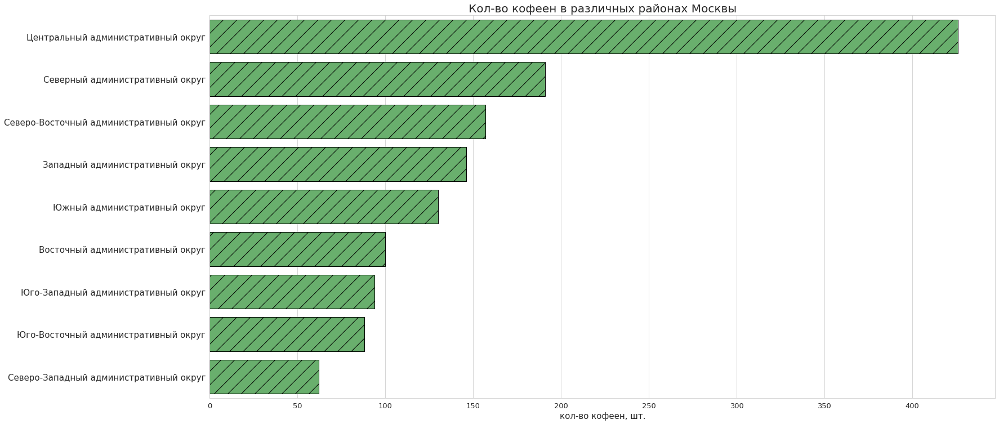

In [57]:
plt.figure(figsize = (25,12.5))

sns.barplot(data = task41, x = 'count', y = 'district', color = '#5DBB63', edgecolor = 'black', hatch = '/')

plt.title('Кол-во кофеен в различных районах Москвы', size = 20)
plt.xlabel('кол-во кофеен, шт.', size = 15)
plt.ylabel('')
plt.yticks(size = 15)
plt.xticks(size = 13)

plt.show()

In [58]:
# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=task41,
    columns=['district', 'count'],
    key_on='feature.name',
    fill_color='YlGn',
    fill_opacity=0.5,
    legend_name='Кол-во кофеен',
    line_opacity=0.2,
).add_to(m)

# выводим карту
m

*Больше всего кофеен в районах ЦАО, СВАО и САО.*

##### 4.2 Есть ли круглосуточные кофейни?

In [59]:
percentage = (round(data[(data.category == 'кофейня') & (data.is_24_7 == True)].shape[0] / 
              data[(data.category == 'кофейня')].shape[0] * 100, 2))

print(f"{percentage}% - процент круглосуточных кофеен.")

4.23% - процент круглосуточных кофеен.


##### 4.3 Какие у кофеен рейтинги? Как они распределяются по районам?

/opt/conda/lib/python3.9/site-packages/seaborn/distributions.py:2557: FutureWarning:

`distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).



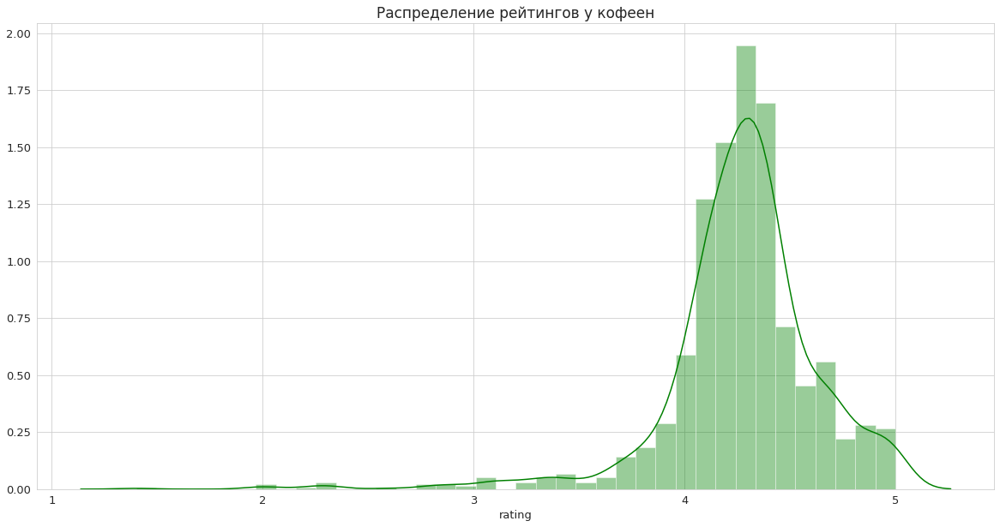

In [60]:
plt.figure(figsize = (20,10))

sns.distplot(data.query('category == "кофейня"').rating, bins = 38, color = 'green')

plt.title('Распределение рейтингов у кофеен', size = 17)

plt.xlabel('rating', size = 13)
plt.xticks(size = 13)

plt.ylabel('')
plt.yticks(size = 13)

plt.show()

In [61]:
coffee_rating_df = data.query('category == "кофейня"').groupby('district', as_index = False).rating.mean()

In [62]:
with open('/datasets/admin_level_geomap.geojson', 'r') as f:
        geo_json = json.load(f)

state_geo = '/datasets/admin_level_geomap.geojson'
# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=coffee_rating_df,
    columns=['district', 'rating'],
    key_on='feature.name',
    fill_color='PuBu',
    fill_opacity=0.5,
    legend_name='Средний рейтинг кофеен по районам',
).add_to(m)

# выводим карту
m

*Самые высокие рейтинги среди кофеен в ЦАО, СЗАО, САО. Хуже всех у ЗАО.*

##### 4.4 На какую стоимость чашки капучино стоит ориентироваться при открытии и почему?

In [63]:
task44 = (data.query('middle_coffee_cup != -1')
              .groupby('district', as_index = False)
              .middle_coffee_cup
              .mean()
              .rename(columns = {'middle_coffee_cup' : 'mean_price_coffee_cup'})
              .sort_values(by = 'mean_price_coffee_cup', ascending = False)
              .reset_index(drop = True))
task44

,district,mean_price_coffee_cup
0,Западный административный округ,189.640000
1,Центральный административный округ,187.624242
2,Юго-Западный административный округ,183.485714
3,Северо-Восточный административный округ,165.333333
4,Северный административный округ,165.090909
5,Северо-Западный административный округ,160.458333
6,Южный административный округ,157.826087
7,Юго-Восточный административный округ,150.771429
8,Восточный административный округ,140.024390


In [64]:
with open('/datasets/admin_level_geomap.geojson', 'r') as f:
        geo_json = json.load(f)

state_geo = '/datasets/admin_level_geomap.geojson'
# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=task44,
    columns=['district', 'mean_price_coffee_cup'],
    key_on='feature.name',
    fill_color='PuBu',
    fill_opacity=0.5,
    legend_name='Средняя цена чашки кофе по округам',
).add_to(m)

# выводим карту
m

*Получается так, что чашка кофе дороже всего в ЦАО, ЮЗАО и ЗАО. (хотя в ЗАО самый низкий рейтинг среди кофеен). Дешевле всего в ВАО.*

***Вывод:***
*При открытии стоит ориентироваться на округ, в котором будет открываться кофейня. В целом в ЦАО гораздо больше конкурентов, чем в каком-либо другом округе, поэтому открыться там будет сложнее. В среднем рейтинг у кофеен примерно одинаковый, но в ЦАО рейтинг всё же чуть-чуть побольше.*

### 5. ПРЕЗЕНТАЦИЯ

https://file.io/MExkmfADtTb1

### 5. Общий вывод

***В ходе исследования были сделаны следующие шаги:***
1. Подключений датасета и нужных инструментов, необходимых для дальнейшего исследования.
2. Выполнили предобработку данных, а именно: очистили от дубликатов и пропусков, некоторые пропуски заменили. Поменяли тип данных в столбцах. Создали 2 новых столбца для дальнейшего анализа данных.
3. Провели большой исследовательский анализ данных. Узнали очень много фактов и инсайтов.
4. Дали рекомендацию для открытия нового заведения.